In [221]:
import os
import numpy as np
import pandas as pd

/var/folders/zg/ds4nwmvx3kq28hn4r4zwbbw80000gp/T/ipykernel_4611/2916776140.py:3: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [2]:
data_path = os.path.join("..", "data", "training", "V12", "annotated", "not_recognizable")

In [46]:
import cv2
import matplotlib.pyplot as plt

def show_image(image_path):
    # Bild mit OpenCV laden (BGR-Format)
    image = cv2.imread(image_path)
    print(image.shape)
    height, width, _ = image.shape
    start_row = height // 2  # Startpunkt der unteren Hälfte
    end_row = height  # Endpunkt ist die gesamte Höhe
    start_col = width // 4  # Mittlerer Bereich: ein Viertel des Bildes von links
    end_col = (3 * width) // 4  # Mittlerer Bereich: ein Viertel von rechts

    # Bild zuschneiden auf unteren mittleren Bereich
    image = image[start_row:end_row, start_col:end_col]

    # Bild von BGR zu RGB konvertieren (für korrekte Farben in Matplotlib)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Bild mit Matplotlib anzeigen
    plt.figure(figsize=(10, 10))
    plt.imshow(image_rgb)
    plt.axis('off')  # Achsen ausblenden
    plt.show()

# Blur

In [42]:
def is_blurry(image_path, threshold=100):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    print(image.shape)
    height, width = image.shape
    start_row = height // 2  # Startpunkt der unteren Hälfte
    end_row = height  # Endpunkt ist die gesamte Höhe
    start_col = width // 4  # Mittlerer Bereich: ein Viertel des Bildes von links
    end_col = (3 * width) // 4  # Mittlerer Bereich: ein Viertel von rechts

    # Bild zuschneiden auf unteren mittleren Bereich
    image = image[start_row:end_row, start_col:end_col]
    laplacian = cv2.Laplacian(image, cv2.CV_64F)
    variance = laplacian.var()
    # return variance < threshold
    return variance

In [219]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def detect_blur_in_bottom_middle(image_path):
    # Bild in Graustufen laden für die Unschärfeerkennung
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    
    # Bilddimensionen erfassen
    height, width = image.shape

    # Bereich in der unteren Bildhälfte bestimmen (Mitte der unteren Hälfte)
    start_row = height // 2  # Startpunkt der unteren Hälfte
    end_row = height  # Endpunkt ist die gesamte Höhe
    start_col = width // 4  # Mittlerer Bereich: ein Viertel des Bildes von links
    end_col = (3 * width) // 4  # Mittlerer Bereich: ein Viertel von rechts

    # Bild zuschneiden auf unteren mittleren Bereich
    cropped_image = image[start_row:end_row, start_col:end_col]

    # Unschärfemessung (Laplacian Methode) für das Originalbild
    laplacian_var_full = cv2.Laplacian(image, cv2.CV_64F).var()

    # Unschärfemessung (Laplacian Methode) für den zugeschnittenen Bereich
    laplacian_var_cropped = cv2.Laplacian(cropped_image, cv2.CV_64F).var()

    # Originalbild in Farbe laden für Visualisierung
    original_image = cv2.imread(image_path)

    # Rechteck zeichnen, das den analysierten Bereich zeigt
    cv2.rectangle(original_image, (start_col, start_row), (end_col, end_row), (0, 255, 0), 3)

    # Bild in RGB umwandeln für die Anzeige mit Matplotlib
    original_image_rgb = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)

    image = cv2.imread(image_path)
    cropped_image = image[start_row:end_row, start_col:end_col]
    cropped_image_rgb = cv2.cvtColor(cropped_image, cv2.COLOR_BGR2RGB)

    # Plot erstellen mit zwei Bildern nebeneinander
    fig, axs = plt.subplots(1, 2, figsize=(15, 10))

    # Originalbild mit markiertem Bereich anzeigen
    axs[0].imshow(original_image_rgb)
    axs[0].axis('off')
    axs[0].set_title(f'Original Image\nVariance of Laplacian: {laplacian_var_full:.2f}')

    # Zugeschnittenen Bereich anzeigen
    axs[1].imshow(cropped_image_rgb)
    axs[1].axis('off')
    axs[1].set_title(f'Cropped Image (Bottom Middle)\nVariance of Laplacian: {laplacian_var_cropped:.2f}')

    # Anzeigen der Bilder
    plt.tight_layout()
    plt.show()

    return laplacian_var_cropped # laplacian_var_full, 


In [212]:
blurred_image_id = '115709007239677' # 106910235588005 102376292162352 111929230971587 115709007239677
non_blurred_image_id = '130559829309917' # 109531971220630 108795277939072 115077537310441 130559829309917

blurred_image_path = os.path.join(data_path, blurred_image_id + '.jpg')
non_blurred_image_path = os.path.join(data_path, non_blurred_image_id + '.jpg')

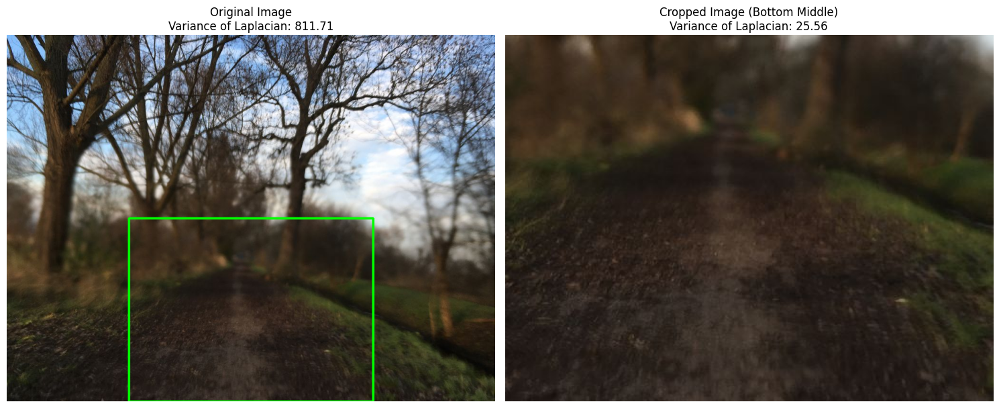

(811.7112986414304, 25.555978720386822)

In [213]:
# show_image(blurred_image_path)
# print(is_blurry(blurred_image_path))
detect_blur_in_bottom_middle(blurred_image_path)

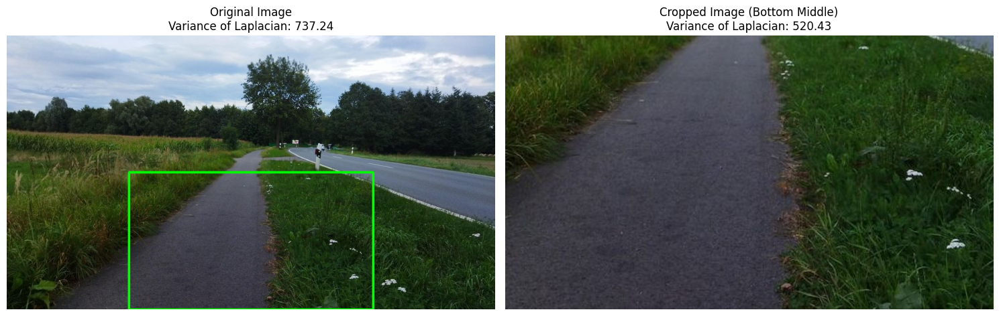

(737.2367204484633, 520.4340503259482)

In [214]:
# show_image(non_blurred_image_path)
# print(is_blurry(non_blurred_image_path))
detect_blur_in_bottom_middle(non_blurred_image_path)

In [311]:
def apply_fft(image_path, size=100): # size=50
    # 1. Bild einlesen und in Graustufen umwandeln
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    height, width = image.shape

    # Bereich in der unteren Bildhälfte bestimmen (Mitte der unteren Hälfte)
    start_row = height // 2  # Startpunkt der unteren Hälfte
    end_row = height  # Endpunkt ist die gesamte Höhe
    start_col = width // 4  # Mittlerer Bereich: ein Viertel des Bildes von links
    end_col = (3 * width) // 4  # Mittlerer Bereich: ein Viertel von rechts

    # Bild zuschneiden auf unteren mittleren Bereich
    image = image[start_row:end_row, start_col:end_col]
    
    # 2. FFT auf das Bild anwenden
    f = np.fft.fft2(image)  # 2D-Fourier-Transformation
    # print(f)
    fshift = np.fft.fftshift(f)  # Mittige Frequenzen verschieben
    # print(fshift)
    magnitude_spectrum = 20 * np.log(np.abs(fshift))  # Magnitudespektrum berechnen
    # print(magnitude_spectrum)

    h, w = image.shape
    cX, cY = int(w / 2.0), int(h / 2.0)
    fshift[cY - size:cY + size, cX - size:cX + size] = 0
    fshift = np.fft.ifftshift(fshift)
    recon = np.fft.ifft2(fshift)
    magnitude = 20 * np.log(np.abs(recon))
    # print(magnitude)

    # 3. Frequenzspektrum visualisieren (optional)
    plt.subplot(121), plt.imshow(image, cmap='gray')
    plt.title('Original Image'), plt.xticks([]), plt.yticks([])
    plt.subplot(122), plt.imshow(magnitude_spectrum, cmap='gray')
    plt.title('FFT of Image'), plt.xticks([]), plt.yticks([])
    plt.show()

    return magnitude_spectrum
    # return magnitude

def is_blurry_fft(image_path, threshold=10):
    # FFT anwenden und Spektrum analysieren
    magnitude = apply_fft(image_path)
    
    # 4. Hochfrequente Komponenten bestimmen (z.B. obere rechte Quadranten)
    h, w = magnitude.shape
    # print(magnitude_spectrum)
    high_freq_magnitude = magnitude[0:int(h//2), 0:int(w//2)].mean()  # Mittelwert der Hochfrequenzen
    # high_freq_magnitude = magnitude.mean()
    
    # Bild als unscharf definieren, wenn der Wert unter einem Schwellenwert liegt
    return high_freq_magnitude



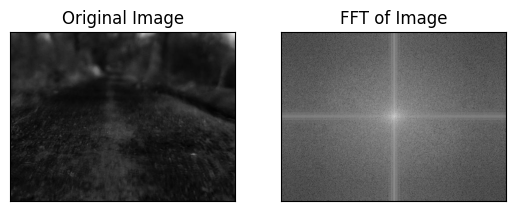

125.55467999731833


In [312]:
print(is_blurry_fft(blurred_image_path))

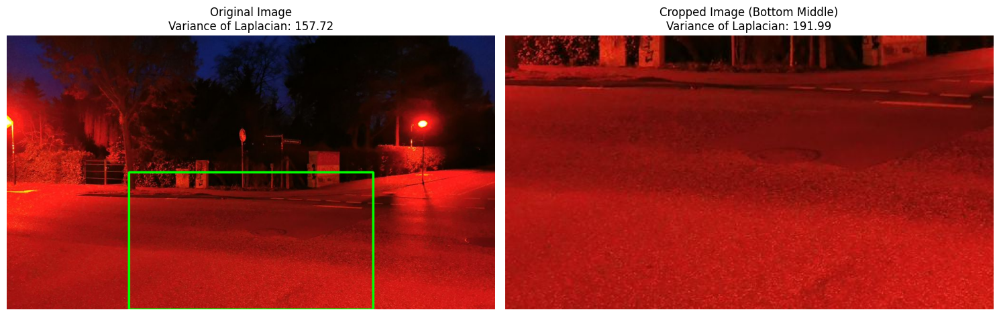

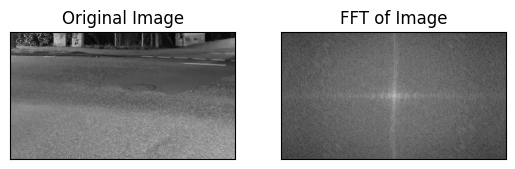

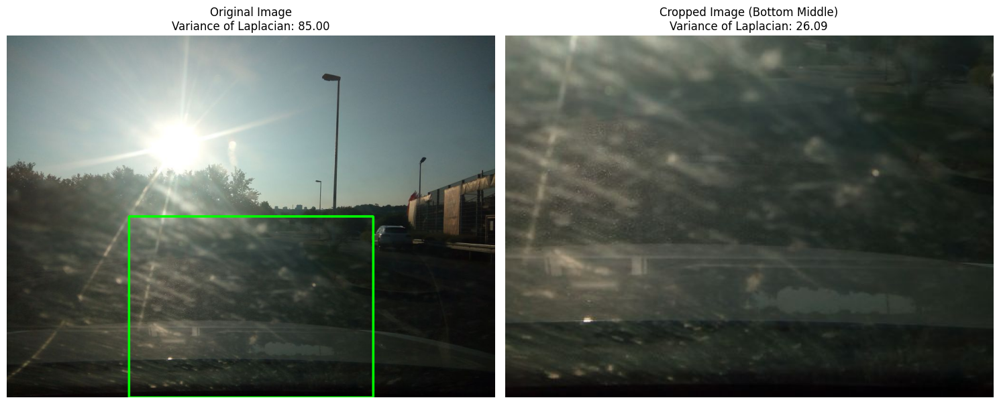

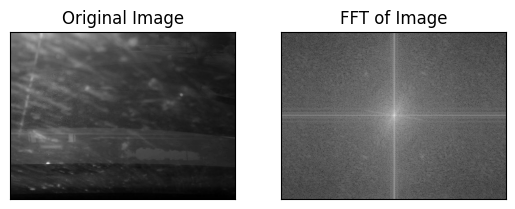

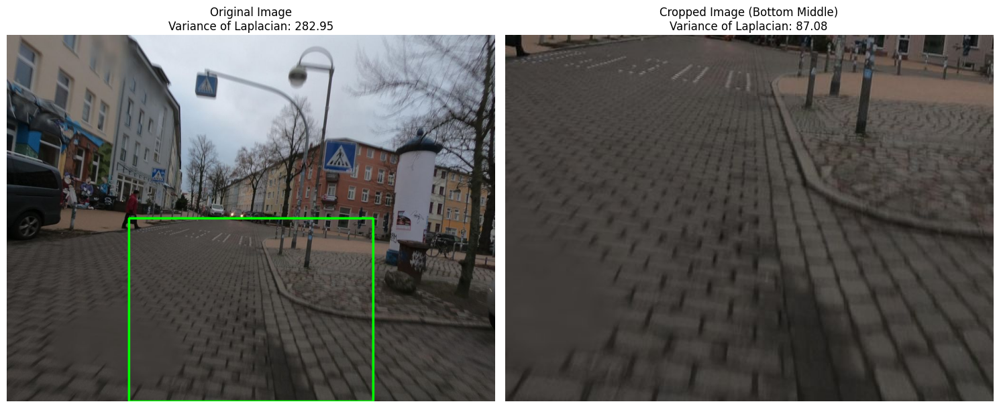

...

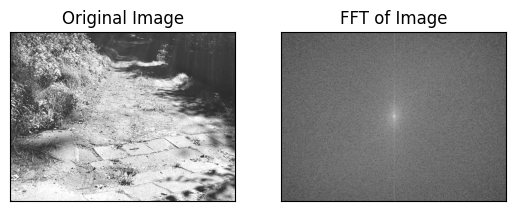

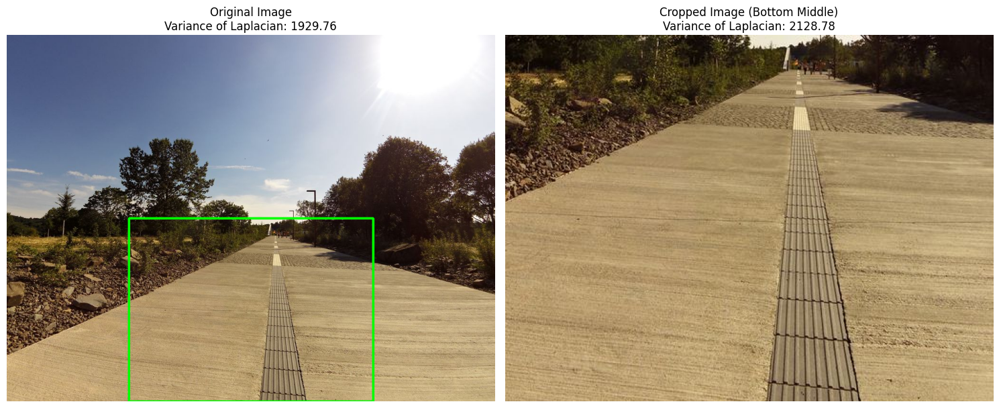

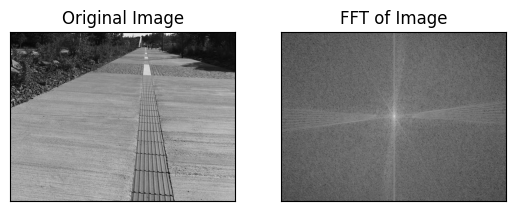

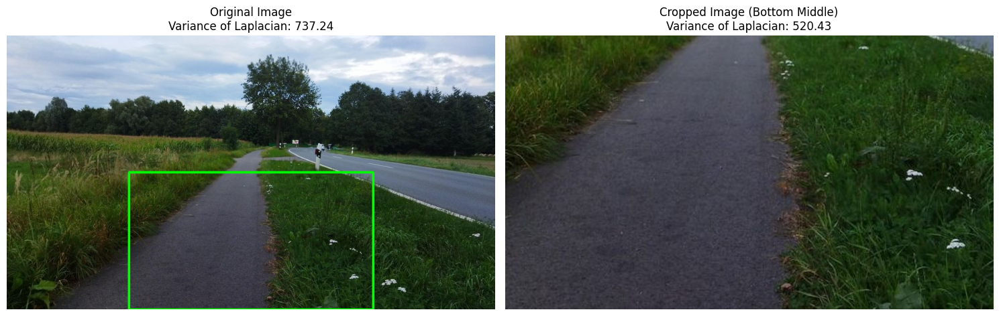

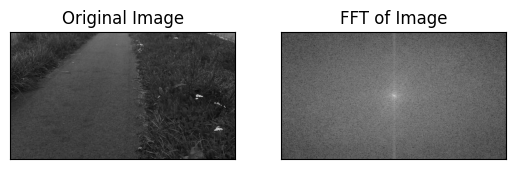

,id,laplacian,fourier
4,111929230971587,7.898909,114.729394
5,115709007239677,25.555979,125.55468
1,214060720173281,26.08539,124.027378
2,106910235588005,87.075776,135.632586
0,319083883015178,191.986782,140.749784
3,102376292162352,306.865455,149.1123
6,109531971220630,480.858504,153.115659
9,130559829309917,520.43405,150.029567
8,115077537310441,2128.776707,164.852555
7,108795277939072,7185.129585,178.228912


In [336]:
images = ['319083883015178', '214060720173281', '106910235588005', '102376292162352', '111929230971587', '115709007239677', '109531971220630', '108795277939072', '115077537310441', '130559829309917']
columns=['id', 'laplacian', 'fourier']
df = pd.DataFrame(columns=columns)
for image_id in images:
    image_path = os.path.join(data_path, image_id + '.jpg')
    i = df.shape[0]
    df.loc[i, columns] = [image_id, detect_blur_in_bottom_middle(image_path=image_path), is_blurry_fft(image_path=image_path)]

df.sort_values(by='laplacian')

# Darkness

In [332]:
def is_dark(image_path, brightness_threshold=50):
    image = cv2.imread(image_path)
    height, width = image.shape[:2]

    # Bereich in der unteren Bildhälfte bestimmen (Mitte der unteren Hälfte)
    start_row = height // 2  # Startpunkt der unteren Hälfte
    # start_row = height * 2 // 3  # Startpunkt unteres Drittel
    end_row = height  # Endpunkt ist die gesamte Höhe
    start_col = width // 4  # Mittlerer Bereich: ein Viertel des Bildes von links
    end_col = (3 * width) // 4  # Mittlerer Bereich: ein Viertel von rechts

    # Bild zuschneiden auf unteren mittleren Bereich
    image = image[start_row:end_row, start_col:end_col]
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    brightness = np.mean(hsv[:, :, 2])  # Kanal V in HSV entspricht der Helligkeit
    return brightness # < brightness_threshold

In [335]:
images = ['319083883015178', '219182906374670', '214060720173281', '189767059776788', '183985896927301', '178806554011076', '140156895028757', '139906815248902', '136844258422811', '175851780971476', '106910235588005', '102376292162352', '111929230971587', '115709007239677', '109531971220630', '108795277939072', '115077537310441', '130559829309917']
columns=['id', 'brightness']
df = pd.DataFrame(columns=columns)
for image_id in images:
    image_path = os.path.join(data_path, image_id + '.jpg')
    i = df.shape[0]
    df.loc[i, columns] = [image_id, is_dark(image_path=image_path)]

df.sort_values(by='brightness')

,id,brightness
4,183985896927301,10.802521
9,175851780971476,11.157104
8,136844258422811,29.37709
5,178806554011076,40.718002
13,115709007239677,46.47261
7,139906815248902,47.74825
2,214060720173281,53.613482
1,219182906374670,58.990972
17,130559829309917,61.091329
10,106910235588005,63.241638
